First of all, I am very keen on trying new methods. This is why I tried an Online/Incremental Learning [1] method in this project for time series forecasting. 

In this method, our model learns from one sample of each training loop. Actually, this type of learning is very handy in the streaming data.

* I used **River** library for online/incremental learning[2],
* I created cyclical features at the feature engineering stage,
* I used a Linear Regression model for time series forecasting (from River),


## Proposed Pipeline

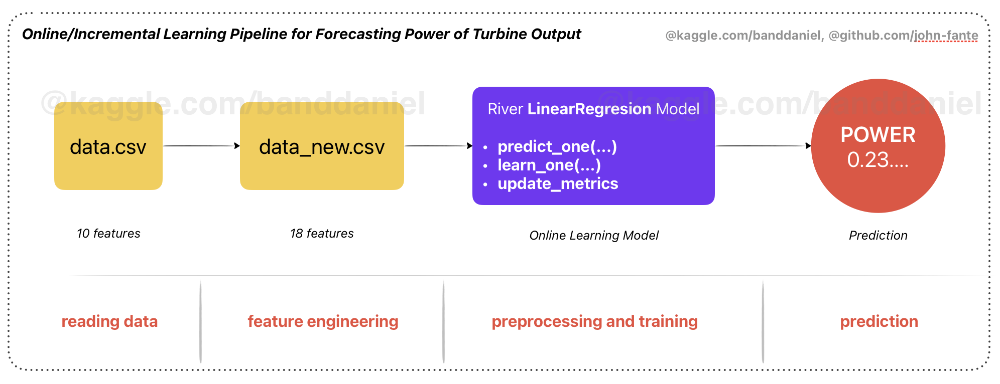



## My Another Projects
* [Smoking Detection w/Online Learning (River)](https://www.kaggle.com/code/banddaniel/smoking-detection-w-online-learning-river)
* [Segmenting HuTu Cells DeepLabv3+ (Test Dice: 0.93)](https://www.kaggle.com/code/banddaniel/segmenting-hutu-cells-deeplabv3-test-dice-0-93)
* [Bladder Tissue Classification w/ViT (F1 Scr: 0.82)](https://www.kaggle.com/code/banddaniel/bladder-tissue-classification-w-vit-f1-scr-0-82)
* [Jellyfish Detect (10CV Custom ConvMixer) (F1:0.87)](https://www.kaggle.com/code/banddaniel/jellyfish-detect-10cv-custom-convmixer-f1-0-87)


## References
1. https://en.wikipedia.org/wiki/Incremental_learning
2. https://riverml.xyz/dev/

In [1]:
# Importing dependencies

import os
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import itertools
import plotly.express as px

In [2]:
from IPython.display import clear_output

!pip install river==0.21.0
!pip install pytest
!pip install scipy==1.11.2

clear_output()

In [3]:
from river import compose, optim, metrics, preprocessing
from river.stream import iter_pandas
from river.linear_model import LinearRegression
from river.utils import Rolling

# <span style="color:#e74c3c;"> Feature  </span> Engineering

In [4]:
# a function for creating time series features

def create_new_features(df):
    df = df.copy()
    df['hour'] = df.index.hour
    df['week'] = df.index.dayofweek
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    
    # creating cycles features
    df['hour_sin'] = np.sin(df['hour']*(2.*np.pi/12))
    df['hour_cos'] = np.sin(df['hour']*(2.*np.pi/12))

    df['week_sin'] = np.sin(df['week']*(2.*np.pi/7))
    df['week_cos'] = np.sin(df['week']*(2.*np.pi/7))

    df['month_sin'] = np.sin(df['month']*(2.*np.pi/12))
    df['month_cos'] = np.sin(df['month']*(2.*np.pi/12))

    df['quarter_sin'] = np.sin(df['quarter']*(2.*np.pi/4))
    df['quarter_cos'] = np.sin(df['quarter']*(2.*np.pi/4))

    df.drop(['hour', 'week', 'month' ,'quarter'], axis = 1, inplace = True)

    return df

In [5]:
# Final dataframe example will use in training stage

data_exp = pd.read_csv('/kaggle/input/wind-power-generation-data-forecasting/Location1.csv')
data_exp.index = pd.to_datetime(data_exp['Time'])

final_data_exp = create_new_features(data_exp)
final_data_exp.head()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power,hour_sin,hour_cos,week_sin,week_cos,month_sin,month_cos,quarter_sin,quarter_cos
Time,,,,,,,,,,,,,,,,,,
2017-01-02 00:00:00,2017-01-02 00:00:00,28.5,85,24.5,1.44,1.26,146,162,1.4,0.1635,0.000000,0.000000,0.0,0.0,0.5,0.5,1.0,1.0
2017-01-02 01:00:00,2017-01-02 01:00:00,28.4,86,24.7,2.06,3.99,151,158,4.4,0.1424,0.500000,0.500000,0.0,0.0,0.5,0.5,1.0,1.0
2017-01-02 02:00:00,2017-01-02 02:00:00,26.8,91,24.5,1.30,2.78,148,150,3.2,0.1214,0.866025,0.866025,0.0,0.0,0.5,0.5,1.0,1.0
2017-01-02 03:00:00,2017-01-02 03:00:00,27.4,88,24.3,1.30,2.69,58,105,1.6,0.1003,1.000000,1.000000,0.0,0.0,0.5,0.5,1.0,1.0
2017-01-02 04:00:00,2017-01-02 04:00:00,27.3,88,24.1,2.47,4.43,58,84,4.0,0.0793,0.866025,0.866025,0.0,0.0,0.5,0.5,1.0,1.0


# <span style="color:#e74c3c;"> Online Learning  </span> Pipeline

In [6]:
def create_online_learning_pipeline(csv_path, window_size = 12):
    
    # reading csv file
    data = pd.read_csv(csv_path)
    data.index = pd.to_datetime(data['Time'])
    
    # creating time features
    data_new = create_new_features(data)
    
    # creating stream dataset
    y = data_new.pop('Power')
    X_y_stream_dataset = iter_pandas(data_new, y)
    
    
    # --------------------  ONLINE/INCREMENTAL LEARNING MODEL  --------------------

    # creatin Online/Incremental model with the River library
    model = compose.Select('temperature_2m', 'relativehumidity_2m', 'dewpoint_2m',
                           'windspeed_10m', 'windspeed_100m', 'winddirection_10m',
                           'winddirection_100m', 'windgusts_10m', 'hour_sin', 'hour_cos',
                           'week_sin', 'week_cos', 'month_sin', 'month_cos', 'quarter_sin','quarter_cos')
    
    
    model |= preprocessing.MinMaxScaler()
    model |= LinearRegression(intercept_lr = 0.1, optimizer=optim.SGD(0.09))
    model
    
    
    # --------------------  TRAINING  --------------------
    # train metrics
    mae_metric = Rolling(metrics.MAE() , window_size = window_size)
    rmse_metric = Rolling(metrics.RMSE() , window_size = window_size)

    dates = data_new.index
    y_trues = []
    y_preds = []
    
    
    # training loop
    for x, y in X_y_stream_dataset:

        y_pred = model.predict_one(x)
        model.learn_one(x, y)
        mae_metric.update(y, y_pred)
        rmse_metric.update(y, y_pred)
    
        y_trues.append(y)
        y_preds.append(y_pred)
        
        
    # final dataframe with predictions
    final_df = pd.DataFrame({'time': data_new.index,'true': y_trues, 'prediction': y_preds}, index = data_new.index)
    print(str(mae_metric) + ' , ' + str(rmse_metric))
    return final_df, mae_metric, rmse_metric



# a function for plotting predictions and ground truths
# data -> data frame
# plot_title -> title of the graph
def plot_predictions(data, plot_title):
    fig = px.line(data, x='time', y=['prediction','true'])
    
    fig.update_layout(xaxis_range=['2021-12-01','2021-12-31'], title_text= plot_title +" Predictions - 2021 December")
    
    fig.update_xaxes(rangeslider_visible=True)
    fig.show()

# <span style="color:#e74c3c;"> Location 1  </span> Training and Prediction

In [7]:
# training
loc1_preds, loc1_mae, loc1_rmse = create_online_learning_pipeline('/kaggle/input/wind-power-generation-data-forecasting/Location1.csv')

# predictions plot
plot_predictions(loc1_preds, 'Location 1')

MAE: 0.056821 , RMSE: 0.064401


# <span style="color:#e74c3c;"> Location 2  </span> Training and Prediction

In [8]:
# training
loc2_preds, loc2_mae, loc2_rmse = create_online_learning_pipeline('/kaggle/input/wind-power-generation-data-forecasting/Location2.csv')

# predictions plot
plot_predictions(loc2_preds, 'Location 2')

MAE: 0.023959 , RMSE: 0.029818


# <span style="color:#e74c3c;"> Location 3  </span> Training and Prediction

In [9]:
# training
loc3_preds, loc3_mae, loc3_rmse = create_online_learning_pipeline('/kaggle/input/wind-power-generation-data-forecasting/Location3.csv')

# predictions plot
plot_predictions(loc3_preds, 'Location 3')

MAE: 0.032523 , RMSE: 0.040761


# <span style="color:#e74c3c;"> Location 4 </span> Training and Prediction

In [10]:
# training
loc4_preds, loc4_mae, loc4_rmse = create_online_learning_pipeline('/kaggle/input/wind-power-generation-data-forecasting/Location4.csv')

# predictions plot
plot_predictions(loc4_preds, 'Location 4')

MAE: 0.039198 , RMSE: 0.043
